# Lab 2 – Base 64 y XOR

## Parte A

In [1]:
from colorama import Fore, Style, init
import random
import string

class Utility:
    def __init__(self):
        self.colors = [Fore.RED, Fore.YELLOW]  

    #region ASCII to Binary
    # https://www.geeksforgeeks.org/python-program-to-covert-decimal-to-binary-number/
    def DecimalToBinary(self, decimal):
        if decimal == 0:
            return "0"
        if decimal == 1:
            return "1"
        return self.DecimalToBinary(decimal // 2) + str(decimal % 2)

    # https://www.geeksforgeeks.org/python-program-to-convert-ascii-to-binary/
    def ascii_to_binary(self, text):
        binary_strings = []
        for char in text:
            number = ord(char)
            b_repr = self.DecimalToBinary(number).zfill(8)  # Asegurar 8 binary por carácter
            binary_strings.append(b_repr)
        return binary_strings
    
    def string_to_binary(self, text):
        """Convierte una cadena a su representación binaria."""
        return ''.join(self.DecimalToBinary(ord(char)) for char in text)


    def print_colored_text(self, text):
        words = text.split()
        colored_text = ""
        for i, word in enumerate(words):
            colored_text += self.colors[i % len(self.colors)] + word + " " + Style.RESET_ALL
        print(f"Cadena Original:\n {colored_text}")

    def print_alternating_colored_binary(self, text):
        words = text.split()
        for i, word in enumerate(words):
            binary_values = self.ascii_to_binary(word)
            binary_colored = " ".join(
                (self.colors[i % len(self.colors)] + b + Style.RESET_ALL)
                if j % 2 == 0 else b  
                for j, b in enumerate(binary_values)
            )
            print(f"Resultado de binario para {self.colors[i % len(self.colors)]}{word}{Style.RESET_ALL}:")
            print(binary_colored)
            print()
    
    #region Base64 to Binary
    def generate_base64_alphabet(self):
        """Genera la tabla Base64 estándar dinámicamente."""
        return (
            [chr(i) for i in range(ord('A'), ord('Z') + 1)] +  # A-Z
            [chr(i) for i in range(ord('a'), ord('z') + 1)] +  # a-z
            [chr(i) for i in range(ord('0'), ord('9') + 1)] +  # 0-9
            ['+', '/']  # Caracteres adicionales de Base64
        )

    # https://minyak128.medium.com/learning-base64-without-using-modules-14983582f969
    def decode_base64(self, encoded_string):
        """Decodifica una cadena Base64 a texto utilizando las funciones existentes."""
        base64_chars = self.generate_base64_alphabet()
        encoded_string = encoded_string.replace('=', '')  # Eliminar el padding

        # Convertir cada carácter a su valor binario de 6 binary usando DecimalToBinary
        binary_str = ""
        for char in encoded_string:
            if char in base64_chars:
                index = base64_chars.index(char)
                binary_str += self.DecimalToBinary(index).zfill(6)

        # Dividir la cadena binaria en bloques de 8 binary
        binary_chunks = [binary_str[i:i + 8] for i in range(0, len(binary_str), 8)]
        
        # Eliminar el último bloque si no tiene 8 binary completos
        if len(binary_chunks[-1]) != 8:
            binary_chunks.pop()

        # Convertir cada bloque binario en su carácter ASCII correspondiente
        decoded_text = "".join(chr(int(b, 2)) for b in binary_chunks)

        return decoded_text
    
    #region Binary to Base64
    def binary_to_base64(self, binary_string):
        """Convierte una cadena binaria a Base64 utilizando la tabla generada dinámicamente."""
        base64_chars = self.generate_base64_alphabet()

        # Asegurar que la longitud de la cadena binaria sea múltiplo de 6
        padding_length = (6 - len(binary_string) % 6) % 6
        binary_string += '0' * padding_length  # Rellenar con ceros si es necesario

        # Dividir la cadena binaria en bloques de 6 binary
        binary_chunks = [binary_string[i:i + 6] for i in range(0, len(binary_string), 6)]

        # Convertir cada bloque de 6 binary a decimal y luego a Base64
        base64_result = ""
        for chunk in binary_chunks:
            decimal_value = int(chunk, 2)
            base64_result += base64_chars[decimal_value]

        # Agregar padding si la longitud original del binario no era múltiplo de 24 binary
        if padding_length > 0:
            base64_result += "=" * (padding_length // 2)

        return base64_result
    
    #region Binary to ASCII
    def binary_to_ascii(self, binary_string):
        """Convierte una cadena binaria a texto ASCII."""
        
        # Asegurar que la longitud del binario sea múltiplo de 8
        if len(binary_string) % 8 != 0:
            raise ValueError("La longitud de la cadena binaria debe ser múltiplo de 8 binary.")

        # Dividir la cadena binaria en bloques de 8 binary
        binary_chunks = [binary_string[i:i+8] for i in range(0, len(binary_string), 8)]

        # Convertir cada bloque de 8 binary a un carácter ASCII
        ascii_chars = [chr(int(chunk, 2)) for chunk in binary_chunks]

        # Unir todos los caracteres para formar la cadena ASCII final
        ascii_text = ''.join(ascii_chars)

        return ascii_text

    #region Base64 to ASCII
    def base64_to_ascii(self, base64_string):
        """Convierte una cadena Base64 a texto ASCII."""
        binary_string = self.decode_base64(base64_string)
        ascii_text = self.binary_to_ascii(binary_string)
        return ascii_text
    
    #region XOR 
    
    # https://stackoverflow.com/questions/19414093/how-to-xor-binary-with-python
    def xor_binary_strings(self, bin1=None, bin2=None, text1=None, text2=None):
        """Realiza la operación XOR entre dos cadenas binarias o de texto.

        Parámetros:
        - bin1, bin2: Cadenas binarias a operar (ejemplo: "1101").
        - text1, text2: Texto que se convertirá a binario antes del XOR.

        Retorna:
        - Cadena binaria con el resultado del XOR.
        """

        # Convertir texto a binario si se proporciona
        if text1 is not None:
            bin1 = ''.join(self.ascii_to_binary(text1))
        if text2 is not None:
            bin2 = ''.join(self.ascii_to_binary(text2))

        # Validar que ambas cadenas binarias estén definidas
        if bin1 is None or bin2 is None:
            raise ValueError("Se requieren bin1/bin2 o text1/text2 para realizar XOR.")

        # Asegurar que ambas cadenas binarias sean de la misma longitud
        max_len = max(len(bin1), len(bin2))
        bin1 = bin1.zfill(max_len)  # Rellenar con ceros a la izquierda
        bin2 = bin2.zfill(max_len)

        # Realizar el XOR bit a bit
        xor_result = ''.join(str(int(bin1[i]) ^ int(bin2[i])) for i in range(len(bin1)))

        return xor_result

    def generate_random_key(self, length):
        """Genera una clave aleatoria de una longitud específica."""
        return ''.join(random.choice(string.ascii_letters + string.digits) for _ in range(length))


    #region cypher ASCII k 
    def encrypt_with_fixed_key(self, text, static_key="", dynamic_key_length=10):
        """Cifra un texto usando una clave estática o una clave aleatoria con XOR.

        Parámetros:
        - text: Texto ASCII a cifrar.
        - static_key: Clave estática (si se proporciona).
        - dynamic_key_length: Longitud de la clave aleatoria si `static_key` no está definido.

        Retorna:
        - Texto cifrado en binario.
        - Clave utilizada en el cifrado.
        """

        # Si no se proporciona una clave estática, se genera una aleatoria
        key = static_key if static_key else self.generate_random_key(dynamic_key_length)

        # Convertir texto y clave a binario
        binary_text = ''.join(self.ascii_to_binary(text))
        binary_key = ''.join(self.ascii_to_binary(key))

        # Repetir la clave hasta igualar la longitud del texto
        extended_key = (binary_key * (len(binary_text) // len(binary_key))) + binary_key[:len(binary_text) % len(binary_key)]

        # Aplicar XOR bit a bit
        encrypted_binary = ''.join(str(int(binary_text[i]) ^ int(extended_key[i])) for i in range(len(binary_text)))

        return encrypted_binary, key  # Devolvemos el texto cifrado y la clave usada

    def decrypt_with_fixed_key(self, encrypted_binary, key):
        """Descifra un texto cifrado usando la misma clave con XOR.

        Parámetros:
        - encrypted_binary: Texto cifrado en binario.
        - key: Clave en ASCII usada en el cifrado.

        Retorna:
        - Texto original en ASCII.
        """
        # Convertir clave a binario
        binary_key = ''.join(self.ascii_to_binary(key))

        # Repetir la clave hasta igualar la longitud del texto cifrado
        extended_key = (binary_key * (len(encrypted_binary) // len(binary_key))) + binary_key[:len(encrypted_binary) % len(binary_key)]

        # Aplicar XOR para descifrar
        decrypted_binary = ''.join(str(int(encrypted_binary[i]) ^ int(extended_key[i])) for i in range(len(encrypted_binary)))

        # Convertir el binario descifrado a ASCII
        decrypted_text = self.binary_to_ascii(decrypted_binary)

        return decrypted_text

util = Utility()

### Ejemplos

In [2]:
ejemplo_1 = "Hola mundo"
ejemplo_2 = "Esto es otro ejemplo sencillo"



### Ejercicio 1

In [3]:

binary_1 = util.ascii_to_binary(ejemplo_1)

print(binary_1)

print("".join(binary_1))

binary_2 = util.ascii_to_binary(ejemplo_2)

print(binary_2)

print("".join(binary_2))

['01001000', '01101111', '01101100', '01100001', '00100000', '01101101', '01110101', '01101110', '01100100', '01101111']
01001000011011110110110001100001001000000110110101110101011011100110010001101111
['01000101', '01110011', '01110100', '01101111', '00100000', '01100101', '01110011', '00100000', '01101111', '01110100', '01110010', '01101111', '00100000', '01100101', '01101010', '01100101', '01101101', '01110000', '01101100', '01101111', '00100000', '01110011', '01100101', '01101110', '01100011', '01101001', '01101100', '01101100', '01101111']
0100010101110011011101000110111100100000011001010111001100100000011011110111010001110010011011110010000001100101011010100110010101101101011100000110110001101111001000000111001101100101011011100110001101101001011011000110110001101111


### Ejercicio 2

In [4]:
print(util.binary_to_ascii("".join(binary_1)))

print(util.binary_to_ascii("".join(binary_2)))

Hola mundo
Esto es otro ejemplo sencillo


### Ejercicio 3

In [5]:
print(util.binary_to_base64("".join(binary_1)))

print(util.binary_to_base64("".join(binary_2)))

SG9sYSBtdW5kbw==
RXN0byBlcyBvdHJvIGVqZW1wbG8gc2VuY2lsbG8=


### Ejercicio 4

In [6]:

base64_text = util.binary_to_base64("".join(binary_1))

print(util.decode_base64(base64_text))

base64_text = util.binary_to_base64("".join(binary_2))

print(util.decode_base64(base64_text))


Hola mundo
Esto es otro ejemplo sencillo


### Ejercicio 5

In [7]:
print(util.xor_binary_strings(text1="Hola", text2="Mundo"))

print(util.xor_binary_strings(bin1="1101", bin2="1010"))

print(util.xor_binary_strings(bin1="1101", bin2="10101"))

0100110100111101000000010000100000001110
0111
11000


## Parte B

In [14]:
%pip install pillow
%pip install IPython

from PIL import Image
import io
from IPython.display import display
from Utility import Utility
import numpy as np




[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


### Ejercicio 1

In [9]:
texto1 = "Hola"
texto2 = "Mundo"

# Aplicar XOR a los textos
xor_result = util.xor_binary_strings(text1=texto1, text2=texto2)

print("Resultado XOR en binario:", xor_result)

# Para decodificarlo de nuevo a texto
texto_original = util.xor_binary_strings(bin1=xor_result, text2=texto2)
print("Texto Original Recuperado:", texto_original)

Resultado XOR en binario: 0100110100111101000000010000100000001110
Texto Original Recuperado: 0000000001001000011011110110110001100001


### Ejercicio 2

In [10]:
def read_image_as_binary(image_path):
    """Lee una imagen como binario."""
    with open(image_path, "rb") as img_file:
        return img_file.read()

def save_binary_as_image(binary_data, output_path):
    """Guarda datos binarios como imagen y la muestra en Jupyter Notebook."""
    image = Image.open(io.BytesIO(binary_data))
    image.save(output_path)
    print(f"Imagen guardada en {output_path}")

    # Mostrar la imagen en Jupyter Notebook
    display(image)

def xor_bytes(data, key):
    """Aplica XOR a nivel de bytes."""
    key_bytes = key.encode()  # Convertir la clave a bytes
    return bytes([data[i] ^ key_bytes[i % len(key_bytes)] for i in range(len(data))])

def decrypt_image_xor(image_path, key, output_path):
    """Descifra una imagen usando XOR con la clave dada y la muestra en Jupyter Notebook."""

    # 1. Leer imagen en binario
    binary_data = read_image_as_binary(image_path)

    # 2. Aplicar XOR directamente a los bytes de la imagen
    decrypted_binary_data = xor_bytes(binary_data, key)

    # 3. Guardar y mostrar la imagen descifrada
    save_binary_as_image(decrypted_binary_data, output_path)

Imagen guardada en imagen_descifrada.png


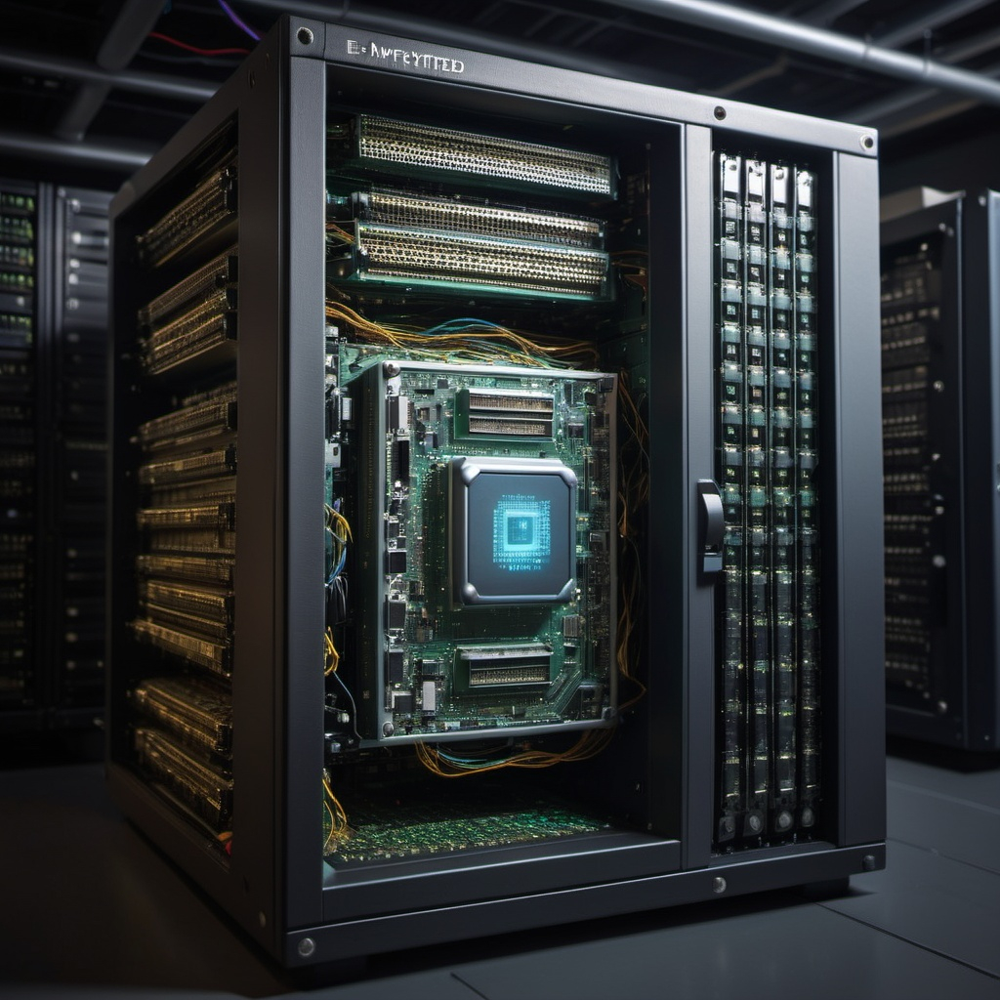

In [11]:
input_image_path = "imagen_xor.png"
output_image_path = "imagen_descifrada.png"
key = "cifrados_2025"

decrypt_image_xor(input_image_path, key, output_image_path)

### Ejercicio 3

Al aplicar XOR con una clave de texto a una imagen, esta se corrompe porque las imágenes están almacenadas en binario, mientras que el texto tiene una estructura diferente. Cuando se usa una clave de texto, su representación en binario puede no alinearse correctamente con los datos de la imagen, lo que altera la forma en que se representan los píxeles. Además, si la clave de texto es más corta que la imagen, se repite a lo largo de los datos, lo que genera patrones no deseados y puede destruir la estructura original de la imagen.

Otro problema ocurre porque XOR es una operación bit a bit, y los caracteres de un texto tienen valores en binario que no están distribuidos uniformemente. Esto puede provocar que algunos píxeles cambien más drásticamente que otros, afectando los colores y el formato del archivo. Para evitar esta corrupción, es mejor usar claves aleatorias de la misma longitud que la imagen o aplicar técnicas más avanzadas de cifrado que preserven la integridad de los datos binarios.

Referencias:
* https://github.com/Tharunaya/CTF-writeups/blob/main/Tenable%20CTF/Stego/secret_images.md
* https://book.jorianwoltjer.com/cryptography/xor
* https://bluegoatcyber.com/blog/how-is-xor-used-in-encryption/

### Ejercicio 4

In [12]:
def load_and_resize_image(image_path, size=None):
    """Carga una imagen y la redimensiona si es necesario."""
    image = Image.open(image_path).convert("RGB")  # Convertir a RGB
    if size:
        image = image.resize(size)
    return image

def xor_images(image1, image2):
    """Aplica XOR bit a bit entre dos imágenes (deben tener el mismo tamaño)."""
    
    # Convertir imágenes a arrays NumPy
    arr1 = np.array(image1)
    arr2 = np.array(image2)
    
    # Aplicar XOR a nivel de bits
    xor_result = np.bitwise_xor(arr1, arr2)

    # Convertir el resultado de vuelta a imagen
    return Image.fromarray(xor_result)

🔹 **Imagen 1 (Original)**:


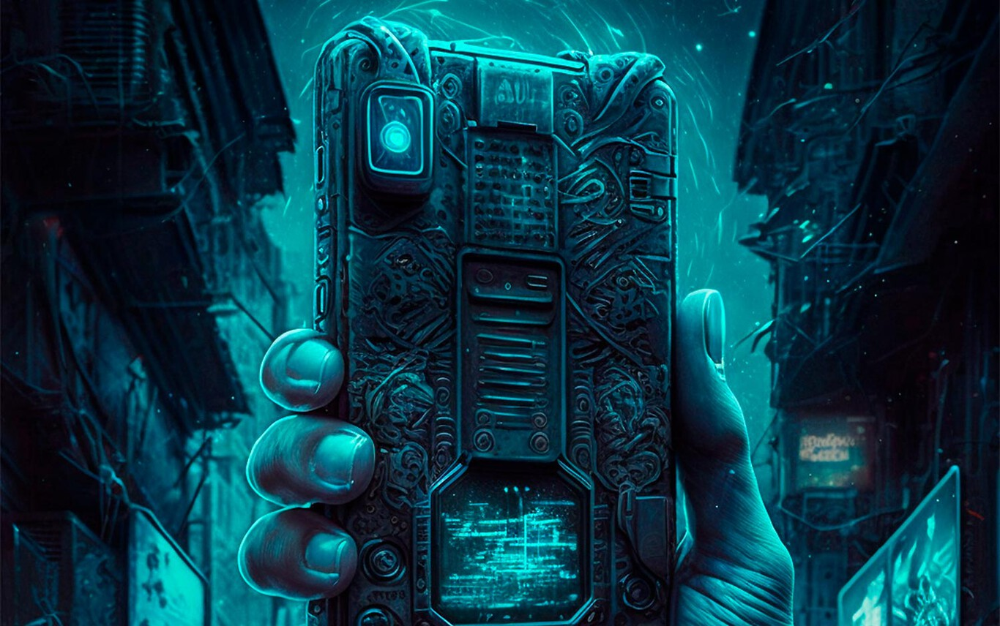

🔹 **Imagen 2 (Llave XOR):**


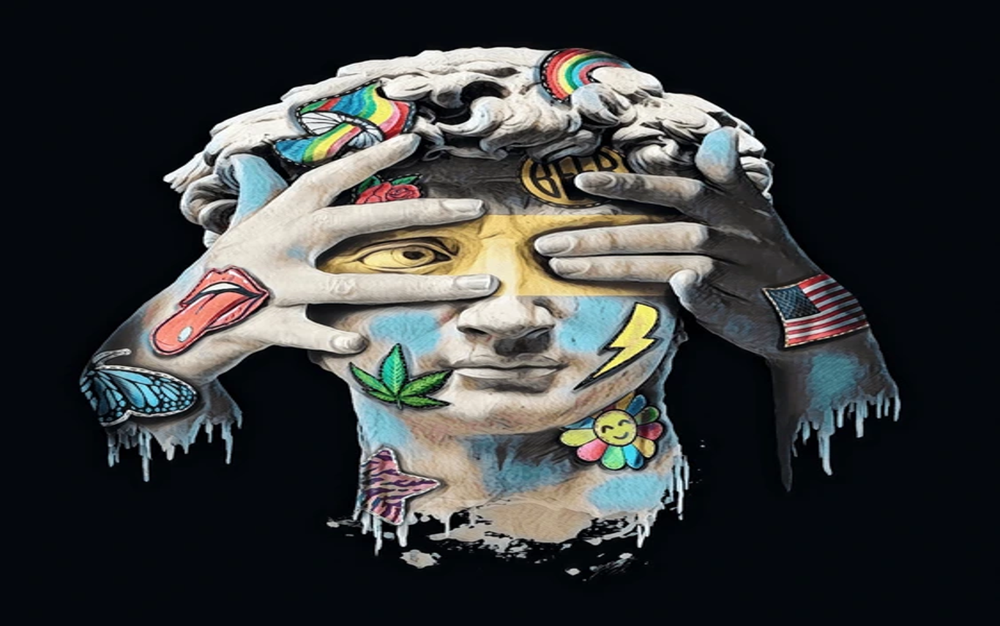

🔹 **Resultado del XOR entre las imágenes:**


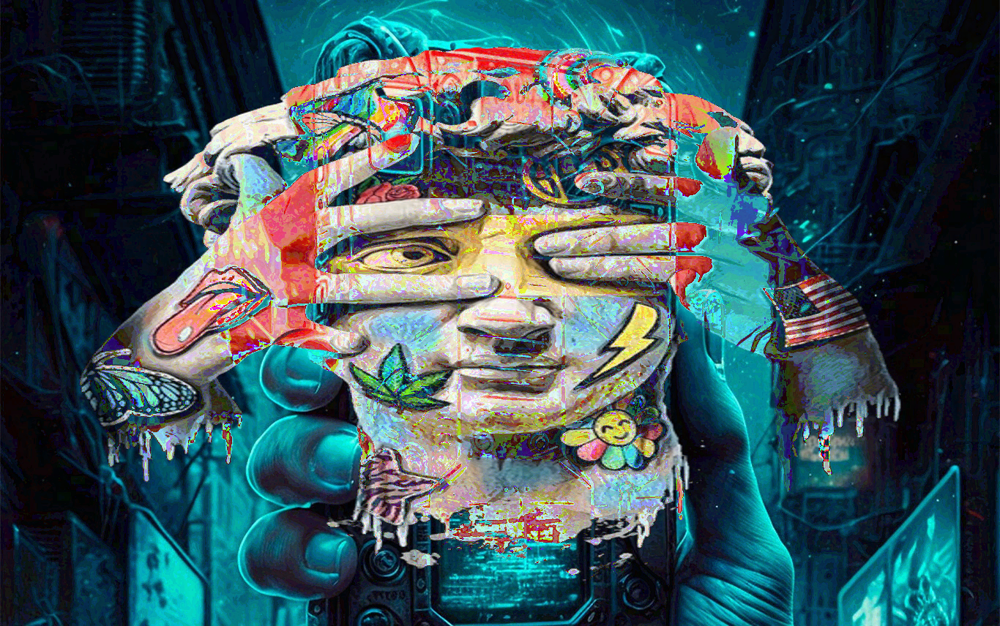

✅ Imagen XOR guardada como 'xor_result.jpeg'.


In [15]:
def main():
    """Función principal que ejecuta el XOR entre imágenes y muestra resultados."""
    
    # Cargar imágenes
    image1 = load_and_resize_image("image_1.jpeg")
    image2 = load_and_resize_image("image_2.jpeg", size=image1.size)  # Asegurar mismo tamaño

    # Aplicar XOR
    xor_image = xor_images(image1, image2)

    # Mostrar imágenes
    print("🔹 **Imagen 1 (Original)**:")
    display(image1)

    print("🔹 **Imagen 2 (Llave XOR):**")
    display(image2)

    print("🔹 **Resultado del XOR entre las imágenes:**")
    display(xor_image)

    # Guardar la imagen XOR
    xor_image.save("xor_result.jpeg")
    print("✅ Imagen XOR guardada como 'xor_result.jpeg'.")

# Ejecutar el proceso
main()

No tuve inconvenientes al aplicar XOR entre las dos imágenes, probablemente porque ambas eran del mismo tamaño o ya estaban alineadas en resolución, evitando problemas de redimensionamiento. Además, si una de las imágenes tenía un fondo negro (RGB = (0,0,0)), la operación XOR no afectó esos píxeles, ya que cualquier valor XOR 0 devuelve el mismo valor, lo que pudo haber mantenido gran parte de la estructura de la imagen y como ambas imágenes estaban en el mismo formato (JPEG o PNG), la conversión entre arrays y la reconstrucción de la imagen funcionaron sin inconvenientes.